## Download Datasets

In [2]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2024-06-22 17:13:37--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.193.24.207, 2600:1417:76:585::317f, 2600:1417:76:581::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.193.24.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M  52.8MB/s    in 10s     

2024-06-22 17:13:48 (76.1 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



## Unzip Datasets

In [3]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

## Import Module

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

## Create Dataframe for input and Output


In [5]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
  for path in os.listdir("PetImages/"+class_name):
      if class_name == 'Cat':
         label.append(0)
      else:
           label.append(1)
      input_path.append(os.path.join("PetImages", class_name, path))
print(input_path[0], label[0])

PetImages/Cat/2840.jpg 0


In [6]:
len(input_path)

25002

In [9]:
df['label'] = df['label'].astype('str')

In [32]:
df = pd.DataFrame()
df['image'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,image,label
0,PetImages/Cat/4559.jpg,0
1,PetImages/Dog/3952.jpg,1
2,PetImages/Dog/2381.jpg,1
3,PetImages/Dog/288.jpg,1
4,PetImages/Cat/878.jpg,0


In [10]:
for i in df['image']:
  if 'jpg' not in i:
    print(i)

PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [11]:
import PIL
l=[]
for image in df['image']:
    try:
        img =PIL.image.open(image)
    except:
      l.append(image)
      l

In [28]:
# delete db file
df = df[df['image']!='PetImages/Cat/Thumbs.db']
df = df[df['image']!='PetImages/Dog/Thumbs.db']
df = df[df['image']!='PetImages/Dog/11702.jpg']
df = df[df['image']!='PetImages/Cat/666.jpg']
len(df)

24998

## Exploratory Data Analysis

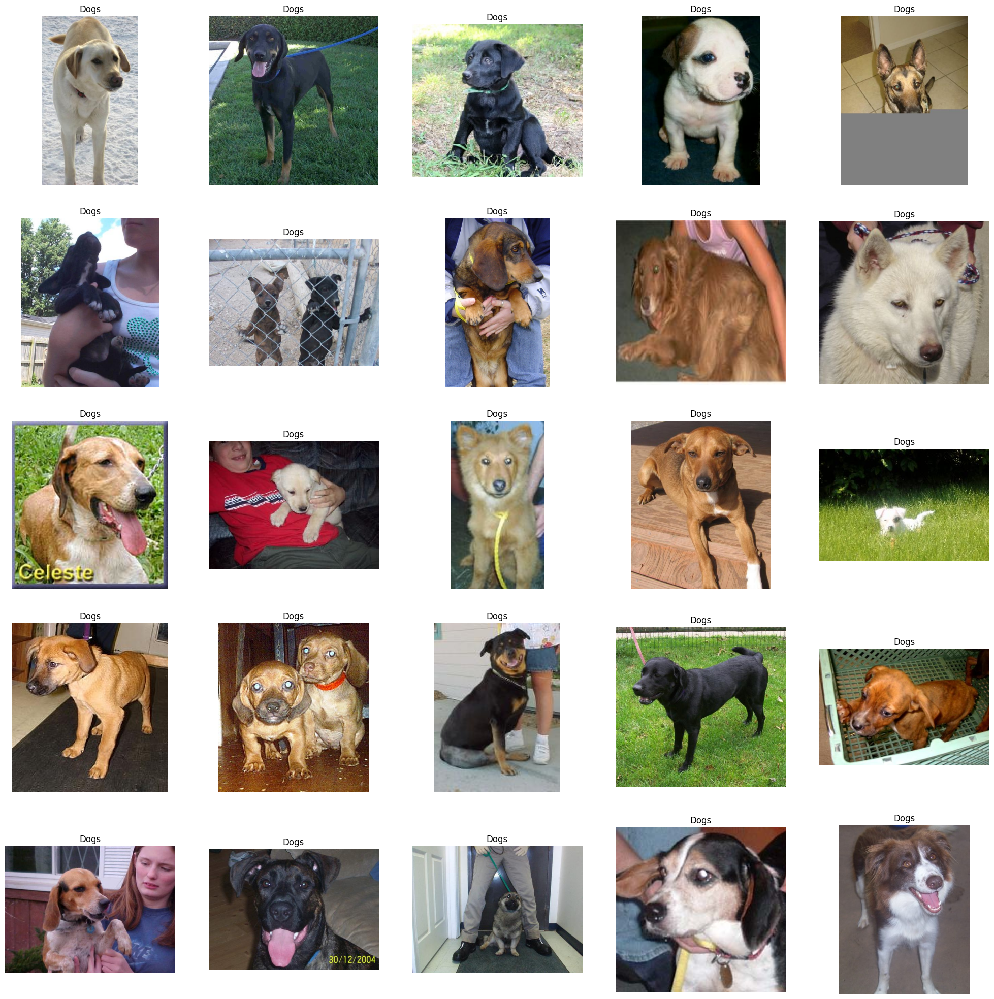

In [34]:
## to display grid of image
plt.figure(figsize=(25,25))
temp = df[df['label']==1]['image']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

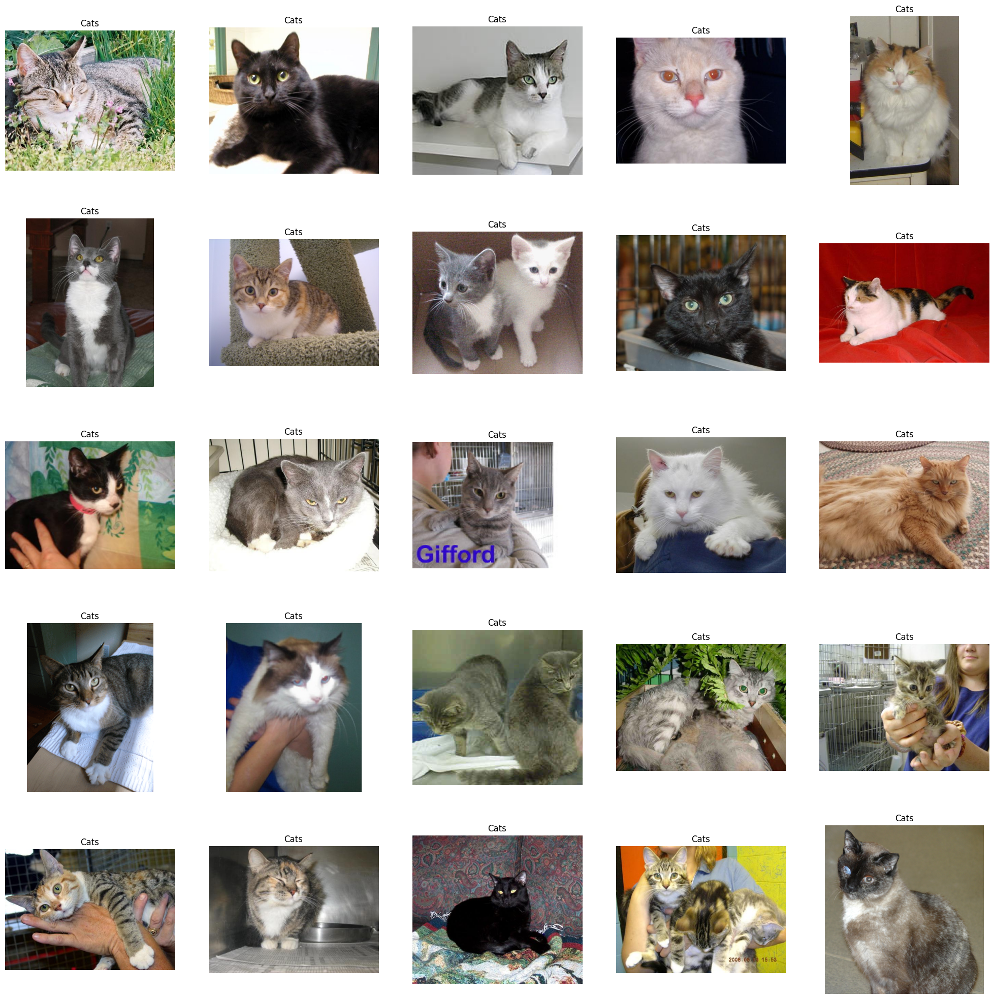

In [35]:
## to display grid of image
plt.figure(figsize=(25,25))
temp = df[df['label']==0]['image']
start = random.randint(0, len(temp))
files = temp[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

<Axes: xlabel='count', ylabel='label'>

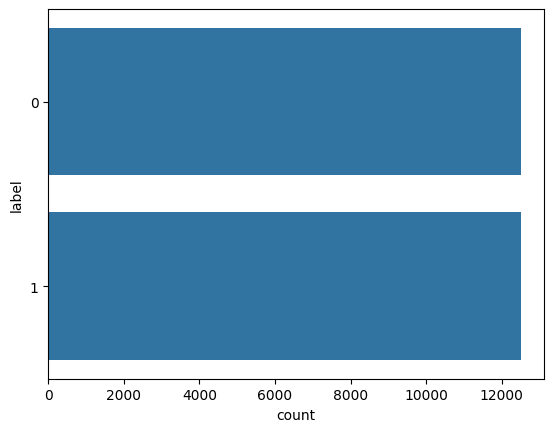

In [ ]:
import seaborn as sns
sns.countplot(df['label'])

## Create DataGenerator for the Image

In [ ]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [ ]:
train.head()

,image,label
23290,PetImages/Cat/12442.jpg,0
17784,PetImages/Dog/4719.jpg,1
1020,PetImages/Dog/4374.jpg,1
12646,PetImages/Cat/8740.jpg,0
1533,PetImages/Cat/7488.jpg,0


In [ ]:
test.head()

,image,label
6868,PetImages/Cat/1560.jpg,0
22914,PetImages/Cat/7199.jpg,0
9668,PetImages/Cat/8995.jpg,0
13640,PetImages/Cat/9354.jpg,0
23341,PetImages/Cat/3944.jpg,0


In [ ]:
# Convert the 'label' column in both 'train' and 'test' DataFrames to strings
train['label'] = train['label'].astype(str)
test['label'] = test['label'].astype(str)

from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
      rescale =1/125,  #normalisation of image
      rotation_range = 40,  #augmentation of image to avoid overfitting
      shear_range =0.2,
      zoom_range = 0.2,
      horizontal_flip = True,
      fill_mode ='nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)
train_iterator = train_generator.flow_from_dataframe(

  train,
  x_col='image', #change column naem to 'image'
  y_col='label',
  target_size=(128,128),
  batch_size=512,
  class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(

  test,
  x_col='image', #change column naem to 'image'
  y_col='label',
  target_size=(128,128),
  batch_size=512,
  class_mode='binary'

)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


## Model Creation

In [ ]:
from keras import Sequential
from keras.layers import Conv2D,MaxPool2D,Dense,Flatten

model = Sequential([
                 Conv2D(16, (3,3),activation='relu', input_shape=(128,128,3)),
                 MaxPool2D((2,2)),
                 Conv2D(32, (3,3),activation='relu'),
                 MaxPool2D((2,2)),
                 Conv2D(64, (3,3), activation='relu'),
                 MaxPool2D((2,2)),
                 Flatten(),
                 Dense(512, activation='relu'),
                 Dense(1, activation='sigmoid')

])

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 64)        0

In [ ]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
40/40 [==============================] - 493s 12s/step - loss: 0.4477 - accuracy: 0.7883 - val_loss: 0.5563 - val_accuracy: 0.7048
Epoch 2/10
40/40 [==============================] - 505s 13s/step - loss: 0.4271 - accuracy: 0.8010 - val_loss: 0.5826 - val_accuracy: 0.6964
Epoch 3/10
40/40 [==============================] - 494s 12s/step - loss: 0.4291 - accuracy: 0.8014 - val_loss: 0.5680 - val_accuracy: 0.7072
Epoch 4/10
40/40 [==============================] - 509s 13s/step - loss: 0.4210 - accuracy: 0.8061 - val_loss: 0.6670 - val_accuracy: 0.6580
Epoch 5/10
40/40 [==============================] - 520s 13s/step - loss: 0.4074 - accuracy: 0.8135 - val_loss: 0.5083 - val_accuracy: 0.7498
Epoch 6/10
40/40 [==============================] - 490s 12s/step - loss: 0.4225 - accuracy: 0.8046 - val_loss: 0.4611 - val_accuracy: 0.7900
Epoch 7/10
40/40 [==============================] - 498s 12s/step - loss: 0.4204 - accuracy: 0.8078 - val_loss: 0.6910 - val_accuracy: 0.6640
Epoch 

<Figure size 640x480 with 0 Axes>

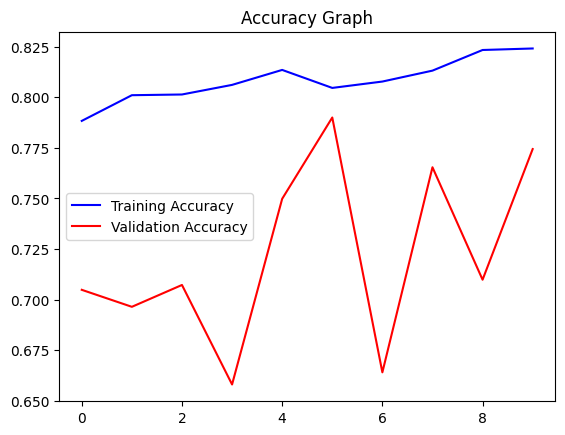

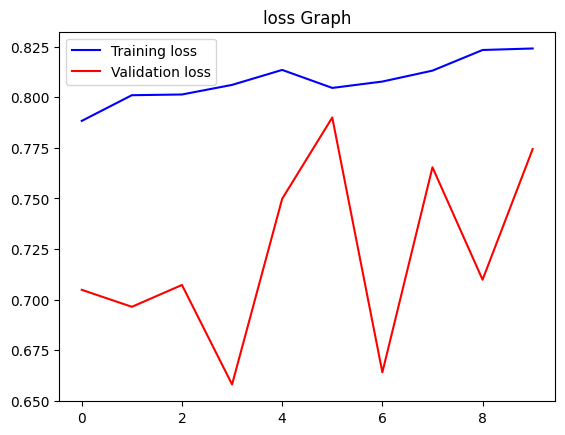

<Figure size 640x480 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, acc, 'b', label='Training loss')
plt.plot(epochs, val_acc, 'r', label='Validation loss')
plt.title('loss Graph')
plt.legend()
plt.figure()

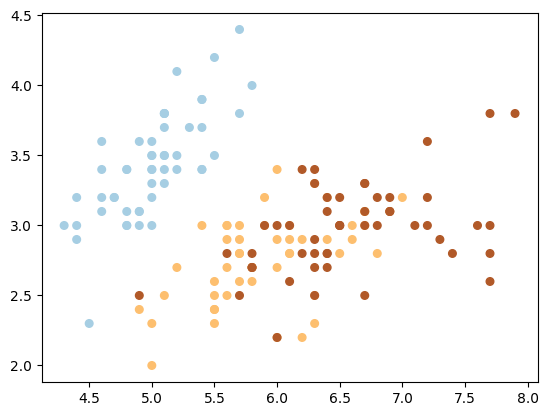

In [ ]:
from sklearn import svm, datasets

# import some data to play with
iris = datasets.load_iris()
X = iris.data[:, :2]  # we only take the first two features.
y = iris.target

# create your SVM model
clf = svm.SVC(kernel="linear", C=100)
clf.fit(X, y)

# plot the decision boundary
plt.scatter(X[:, 0], X[:, 1], c=y, s=30, cmap=plt.cm.Paired)

# plot the support vectors
ax = plt.gca()
xlim = ax.get_xlim()
ylim = ax.get_ylim()